# OBS spectrogram

In [1]:
import ooipy
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import datetime
from tqdm import tqdm

In [2]:
lf_nodes = ['AXAS1', 'AXAS2', 'AXBA1', 'AXCC1', 'AXEC1', 'AXEC2', 'AXEC3', 'AXID1', 'HYS11', 'HYS12', 'HYS13', 'HYS14', 'HYSB1']
cal = [8.44986E8, 8.44986E8, 9.07909E8, 9.24794E8, 8.44986E8, 9.24587E8, 8.44986E8, 8.44986E8, 8.44986E8, 8.44986E8, 8.44986E8, 9.22982E8, 9.21043E8]
lfhyd_nodes = ['AXBA1','AXCC1','AXEC2','HYS14','HYSB1']

# construct list of lf devices (hydrophones and seismometers)
obss = {}
for k, node in enumerate(lf_nodes):
    if node in lfhyd_nodes:
        obss[node] = {'channel':'HHZ', 'cal':cal[k]}
    else:
        obss[node] = {'channel':'EHZ', 'cal':cal[k]}

In [3]:
day = datetime.datetime(2015,1,1,0)

while day < datetime.datetime(2023,1,1):
    print(f'downloading data for {day}...')
    Sxs_day = []
    nperseg=2048
    f_coord = np.linspace(0,100,int(nperseg/2)+1)

    for k in tqdm(range(24)):
        starttime = day + datetime.timedelta(minutes=k)
        endtime = day + datetime.timedelta(minutes=k+1)
        print(starttime, endtime)
        Sxs = {}

        for obs in obss:
            hdata = ooipy.get_acoustic_data_LF(starttime, endtime, node=obs, channel=obss[obs]['channel'], verbose=False)
            if hdata is not None:
                data_cal = hdata.data/obss[obs]['cal']
                # if less than 1/4 of data is present, throw out
                if len(data_cal) < 180e3:
                    data_cal = None
            else:
                data_cal = None

            if data_cal is not None:
                _,S = signal.welch(data_cal, fs=200, nperseg=2048, average='median', scaling='density')
                Sxs[obs] = xr.DataArray(
                    20*np.log10(np.expand_dims(S, axis=0)),
                    dims=['time', 'frequency'],
                    coords={'time':[starttime], 'frequency':f_coord},
                    name=obs, 
                    attrs={'units':'dB rel 1 $(m/s)^2/Hz$'}
                )        
            else:
                Sxs[obs] = xr.DataArray(
                    np.ones((1, 1025))*np.nan,
                    dims=['time', 'frequency'],
                    coords={'time':[starttime], 'frequency':f_coord},
                    name=obs,
                    attrs={'units':'dB rel 1 $(m/s)^2/Hz$'}
                )   
        Sxs_day.append(xr.Dataset(Sxs))
    specs_day = xr.concat(Sxs_day, dim='time')
    fn = f'/Volumes/Ocean_Acoustics/OOI_OBS_specs/{day.strftime("%Y%m%d")}.nc'
    specs_day.to_netcdf(fn)
    day = day + datetime.timedelta(days=1)

downloading data for 2015-01-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150101.nc
downloading data for 2015-01-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150102.nc
downloading data for 2015-01-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150103.nc
downloading data for 2015-01-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150104.nc
downloading data for 2015-01-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150105.nc
downloading data for 2015-01-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150106.nc
downloading data for 2015-01-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150107.nc
downloading data for 2015-01-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150108.nc
downloading data for 2015-01-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150109.nc
downloading data for 2015-01-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150110.nc
downloading data for 2015-01-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150111.nc
downloading data for 2015-01-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150112.nc
downloading data for 2015-01-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150113.nc
downloading data for 2015-01-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150114.nc
downloading data for 2015-01-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150115.nc
downloading data for 2015-01-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150116.nc
downloading data for 2015-01-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150117.nc
downloading data for 2015-01-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150118.nc
downloading data for 2015-01-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150119.nc
downloading data for 2015-01-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150120.nc
downloading data for 2015-01-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150121.nc
downloading data for 2015-01-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150122.nc
downloading data for 2015-01-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150123.nc
downloading data for 2015-01-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150124.nc
downloading data for 2015-01-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150125.nc
downloading data for 2015-01-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150126.nc
downloading data for 2015-01-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150127.nc
downloading data for 2015-01-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150128.nc
downloading data for 2015-01-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150129.nc
downloading data for 2015-01-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150130.nc
downloading data for 2015-01-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150131.nc
downloading data for 2015-02-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150201.nc
downloading data for 2015-02-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150202.nc
downloading data for 2015-02-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150203.nc
downloading data for 2015-02-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150204.nc
downloading data for 2015-02-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150205.nc
downloading data for 2015-02-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150206.nc
downloading data for 2015-02-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150207.nc
downloading data for 2015-02-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150208.nc
downloading data for 2015-02-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150209.nc
downloading data for 2015-02-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150210.nc
downloading data for 2015-02-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150211.nc
downloading data for 2015-02-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150212.nc
downloading data for 2015-02-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150213.nc
downloading data for 2015-02-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150214.nc
downloading data for 2015-02-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150215.nc
downloading data for 2015-02-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150216.nc
downloading data for 2015-02-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150217.nc
downloading data for 2015-02-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150218.nc
downloading data for 2015-02-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150219.nc
downloading data for 2015-02-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150220.nc
downloading data for 2015-02-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150221.nc
downloading data for 2015-02-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150222.nc
downloading data for 2015-02-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150223.nc
downloading data for 2015-02-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150224.nc
downloading data for 2015-02-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150225.nc
downloading data for 2015-02-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150226.nc
downloading data for 2015-02-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150227.nc
downloading data for 2015-02-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150228.nc
downloading data for 2015-03-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150301.nc
downloading data for 2015-03-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150302.nc
downloading data for 2015-03-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150303.nc
downloading data for 2015-03-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150304.nc
downloading data for 2015-03-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150305.nc
downloading data for 2015-03-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150306.nc
downloading data for 2015-03-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150307.nc
downloading data for 2015-03-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150308.nc
downloading data for 2015-03-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150309.nc
downloading data for 2015-03-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150310.nc
downloading data for 2015-03-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150311.nc
downloading data for 2015-03-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150312.nc
downloading data for 2015-03-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150313.nc
downloading data for 2015-03-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150314.nc
downloading data for 2015-03-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150315.nc
downloading data for 2015-03-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150316.nc
downloading data for 2015-03-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150317.nc
downloading data for 2015-03-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150318.nc
downloading data for 2015-03-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150319.nc
downloading data for 2015-03-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150320.nc
downloading data for 2015-03-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150321.nc
downloading data for 2015-03-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150322.nc
downloading data for 2015-03-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150323.nc
downloading data for 2015-03-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150324.nc
downloading data for 2015-03-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150325.nc
downloading data for 2015-03-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150326.nc
downloading data for 2015-03-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150327.nc
downloading data for 2015-03-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150328.nc
downloading data for 2015-03-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150329.nc
downloading data for 2015-03-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150330.nc
downloading data for 2015-03-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150331.nc
downloading data for 2015-04-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150401.nc
downloading data for 2015-04-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150402.nc
downloading data for 2015-04-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150403.nc
downloading data for 2015-04-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150404.nc
downloading data for 2015-04-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150405.nc
downloading data for 2015-04-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150406.nc
downloading data for 2015-04-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150407.nc
downloading data for 2015-04-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150408.nc
downloading data for 2015-04-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150409.nc
downloading data for 2015-04-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150410.nc
downloading data for 2015-04-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150411.nc
downloading data for 2015-04-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150412.nc
downloading data for 2015-04-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150413.nc
downloading data for 2015-04-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150414.nc
downloading data for 2015-04-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150415.nc
downloading data for 2015-04-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150416.nc
downloading data for 2015-04-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150417.nc
downloading data for 2015-04-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150418.nc
downloading data for 2015-04-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150419.nc
downloading data for 2015-04-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150420.nc
downloading data for 2015-04-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150421.nc
downloading data for 2015-04-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150422.nc
downloading data for 2015-04-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150423.nc
downloading data for 2015-04-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150424.nc
downloading data for 2015-04-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150425.nc
downloading data for 2015-04-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150426.nc
downloading data for 2015-04-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150427.nc
downloading data for 2015-04-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150428.nc
downloading data for 2015-04-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150429.nc
downloading data for 2015-04-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150430.nc
downloading data for 2015-05-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150501.nc
downloading data for 2015-05-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150502.nc
downloading data for 2015-05-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150503.nc
downloading data for 2015-05-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150504.nc
downloading data for 2015-05-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150505.nc
downloading data for 2015-05-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150506.nc
downloading data for 2015-05-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150507.nc
downloading data for 2015-05-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150508.nc
downloading data for 2015-05-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150509.nc
downloading data for 2015-05-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150510.nc
downloading data for 2015-05-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150511.nc
downloading data for 2015-05-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150512.nc
downloading data for 2015-05-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150513.nc
downloading data for 2015-05-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150514.nc
downloading data for 2015-05-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150515.nc
downloading data for 2015-05-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150516.nc
downloading data for 2015-05-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150517.nc
downloading data for 2015-05-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150518.nc
downloading data for 2015-05-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150519.nc
downloading data for 2015-05-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150520.nc
downloading data for 2015-05-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150521.nc
downloading data for 2015-05-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150522.nc
downloading data for 2015-05-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150523.nc
downloading data for 2015-05-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150524.nc
downloading data for 2015-05-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150525.nc
downloading data for 2015-05-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150526.nc
downloading data for 2015-05-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150527.nc
downloading data for 2015-05-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150528.nc
downloading data for 2015-05-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150529.nc
downloading data for 2015-05-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150530.nc
downloading data for 2015-05-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150531.nc
downloading data for 2015-06-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150601.nc
downloading data for 2015-06-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150602.nc
downloading data for 2015-06-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150603.nc
downloading data for 2015-06-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150604.nc
downloading data for 2015-06-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150605.nc
downloading data for 2015-06-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150606.nc
downloading data for 2015-06-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150607.nc
downloading data for 2015-06-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150608.nc
downloading data for 2015-06-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150609.nc
downloading data for 2015-06-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150610.nc
downloading data for 2015-06-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150611.nc
downloading data for 2015-06-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150612.nc
downloading data for 2015-06-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150613.nc
downloading data for 2015-06-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150614.nc
downloading data for 2015-06-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150615.nc
downloading data for 2015-06-16 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150616.nc
downloading data for 2015-06-17 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150617.nc
downloading data for 2015-06-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150618.nc
downloading data for 2015-06-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150619.nc
downloading data for 2015-06-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150620.nc
downloading data for 2015-06-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150621.nc
downloading data for 2015-06-22 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150622.nc
downloading data for 2015-06-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150623.nc
downloading data for 2015-06-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150624.nc
downloading data for 2015-06-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150625.nc
downloading data for 2015-06-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150626.nc
downloading data for 2015-06-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150627.nc
downloading data for 2015-06-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150628.nc
downloading data for 2015-06-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150629.nc
downloading data for 2015-06-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150630.nc
downloading data for 2015-07-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150701.nc
downloading data for 2015-07-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150702.nc
downloading data for 2015-07-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150703.nc
downloading data for 2015-07-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150704.nc
downloading data for 2015-07-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150705.nc
downloading data for 2015-07-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150706.nc
downloading data for 2015-07-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150707.nc
downloading data for 2015-07-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150708.nc
downloading data for 2015-07-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150709.nc
downloading data for 2015-07-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150710.nc
downloading data for 2015-07-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150711.nc
downloading data for 2015-07-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150712.nc
downloading data for 2015-07-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150713.nc
downloading data for 2015-07-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150714.nc
downloading data for 2015-07-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150715.nc
downloading data for 2015-07-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150716.nc
downloading data for 2015-07-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150717.nc
downloading data for 2015-07-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150718.nc
downloading data for 2015-07-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150719.nc
downloading data for 2015-07-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150720.nc
downloading data for 2015-07-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150721.nc
downloading data for 2015-07-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150722.nc
downloading data for 2015-07-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150723.nc
downloading data for 2015-07-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150724.nc
downloading data for 2015-07-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150725.nc
downloading data for 2015-07-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150726.nc
downloading data for 2015-07-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150727.nc
downloading data for 2015-07-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150728.nc
downloading data for 2015-07-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150729.nc
downloading data for 2015-07-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150730.nc
downloading data for 2015-07-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150731.nc
downloading data for 2015-08-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150801.nc
downloading data for 2015-08-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150802.nc
downloading data for 2015-08-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150803.nc
downloading data for 2015-08-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150804.nc
downloading data for 2015-08-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150805.nc
downloading data for 2015-08-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150806.nc
downloading data for 2015-08-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150807.nc
downloading data for 2015-08-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150808.nc
downloading data for 2015-08-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150809.nc
downloading data for 2015-08-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150810.nc
downloading data for 2015-08-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150811.nc
downloading data for 2015-08-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150812.nc
downloading data for 2015-08-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150813.nc
downloading data for 2015-08-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150814.nc
downloading data for 2015-08-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150815.nc
downloading data for 2015-08-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150816.nc
downloading data for 2015-08-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150817.nc
downloading data for 2015-08-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150818.nc
downloading data for 2015-08-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150819.nc
downloading data for 2015-08-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150820.nc
downloading data for 2015-08-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150821.nc
downloading data for 2015-08-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150822.nc
downloading data for 2015-08-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150823.nc
downloading data for 2015-08-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150824.nc
downloading data for 2015-08-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150825.nc
downloading data for 2015-08-26 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150826.nc
downloading data for 2015-08-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150827.nc
downloading data for 2015-08-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150828.nc
downloading data for 2015-08-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150829.nc
downloading data for 2015-08-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150830.nc
downloading data for 2015-08-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150831.nc
downloading data for 2015-09-01 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150901.nc
downloading data for 2015-09-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150902.nc
downloading data for 2015-09-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150903.nc
downloading data for 2015-09-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150904.nc
downloading data for 2015-09-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150905.nc
downloading data for 2015-09-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150906.nc
downloading data for 2015-09-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150907.nc
downloading data for 2015-09-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150908.nc
downloading data for 2015-09-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150909.nc
downloading data for 2015-09-10 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150910.nc
downloading data for 2015-09-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150911.nc
downloading data for 2015-09-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150912.nc
downloading data for 2015-09-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150913.nc
downloading data for 2015-09-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150914.nc
downloading data for 2015-09-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150915.nc
downloading data for 2015-09-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150916.nc
downloading data for 2015-09-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150917.nc
downloading data for 2015-09-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150918.nc
downloading data for 2015-09-19 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150919.nc
downloading data for 2015-09-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150920.nc
downloading data for 2015-09-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150921.nc
downloading data for 2015-09-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150922.nc
downloading data for 2015-09-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150923.nc
downloading data for 2015-09-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150924.nc
downloading data for 2015-09-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150925.nc
downloading data for 2015-09-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150926.nc
downloading data for 2015-09-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150927.nc
downloading data for 2015-09-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150928.nc
downloading data for 2015-09-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150929.nc
downloading data for 2015-09-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20150930.nc
downloading data for 2015-10-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151001.nc
downloading data for 2015-10-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151002.nc
downloading data for 2015-10-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151003.nc
downloading data for 2015-10-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151004.nc
downloading data for 2015-10-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151005.nc
downloading data for 2015-10-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151006.nc
downloading data for 2015-10-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151007.nc
downloading data for 2015-10-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151008.nc
downloading data for 2015-10-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151009.nc
downloading data for 2015-10-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151010.nc
downloading data for 2015-10-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151011.nc
downloading data for 2015-10-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151012.nc
downloading data for 2015-10-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151013.nc
downloading data for 2015-10-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151014.nc
downloading data for 2015-10-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151015.nc
downloading data for 2015-10-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151016.nc
downloading data for 2015-10-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151017.nc
downloading data for 2015-10-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151018.nc
downloading data for 2015-10-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151019.nc
downloading data for 2015-10-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151020.nc
downloading data for 2015-10-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151021.nc
downloading data for 2015-10-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151022.nc
downloading data for 2015-10-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151023.nc
downloading data for 2015-10-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151024.nc
downloading data for 2015-10-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151025.nc
downloading data for 2015-10-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151026.nc
downloading data for 2015-10-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151027.nc
downloading data for 2015-10-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151028.nc
downloading data for 2015-10-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151029.nc
downloading data for 2015-10-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151030.nc
downloading data for 2015-10-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151031.nc
downloading data for 2015-11-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151101.nc
downloading data for 2015-11-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151102.nc
downloading data for 2015-11-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151103.nc
downloading data for 2015-11-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151104.nc
downloading data for 2015-11-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151105.nc
downloading data for 2015-11-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151106.nc
downloading data for 2015-11-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151107.nc
downloading data for 2015-11-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151108.nc
downloading data for 2015-11-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151109.nc
downloading data for 2015-11-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151110.nc
downloading data for 2015-11-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151111.nc
downloading data for 2015-11-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151112.nc
downloading data for 2015-11-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151113.nc
downloading data for 2015-11-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151114.nc
downloading data for 2015-11-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151115.nc
downloading data for 2015-11-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151116.nc
downloading data for 2015-11-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151117.nc
downloading data for 2015-11-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151118.nc
downloading data for 2015-11-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151119.nc
downloading data for 2015-11-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151120.nc
downloading data for 2015-11-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151121.nc
downloading data for 2015-11-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151122.nc
downloading data for 2015-11-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151123.nc
downloading data for 2015-11-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151124.nc
downloading data for 2015-11-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151125.nc
downloading data for 2015-11-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151126.nc
downloading data for 2015-11-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151127.nc
downloading data for 2015-11-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151128.nc
downloading data for 2015-11-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151129.nc
downloading data for 2015-11-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151130.nc
downloading data for 2015-12-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151201.nc
downloading data for 2015-12-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151202.nc
downloading data for 2015-12-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151203.nc
downloading data for 2015-12-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151204.nc
downloading data for 2015-12-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151205.nc
downloading data for 2015-12-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151206.nc
downloading data for 2015-12-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151207.nc
downloading data for 2015-12-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151208.nc
downloading data for 2015-12-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151209.nc
downloading data for 2015-12-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151210.nc
downloading data for 2015-12-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151211.nc
downloading data for 2015-12-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151212.nc
downloading data for 2015-12-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151213.nc
downloading data for 2015-12-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151214.nc
downloading data for 2015-12-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151215.nc
downloading data for 2015-12-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151216.nc
downloading data for 2015-12-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151217.nc
downloading data for 2015-12-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151218.nc
downloading data for 2015-12-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151219.nc
downloading data for 2015-12-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151220.nc
downloading data for 2015-12-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151221.nc
downloading data for 2015-12-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151222.nc
downloading data for 2015-12-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151223.nc
downloading data for 2015-12-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151224.nc
downloading data for 2015-12-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151225.nc
downloading data for 2015-12-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151226.nc
downloading data for 2015-12-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151227.nc
downloading data for 2015-12-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151228.nc
downloading data for 2015-12-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151229.nc
downloading data for 2015-12-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151230.nc
downloading data for 2015-12-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20151231.nc
downloading data for 2016-01-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160101.nc
downloading data for 2016-01-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160102.nc
downloading data for 2016-01-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160103.nc
downloading data for 2016-01-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160104.nc
downloading data for 2016-01-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160105.nc
downloading data for 2016-01-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160106.nc
downloading data for 2016-01-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160107.nc
downloading data for 2016-01-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160108.nc
downloading data for 2016-01-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160109.nc
downloading data for 2016-01-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160110.nc
downloading data for 2016-01-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160111.nc
downloading data for 2016-01-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160112.nc
downloading data for 2016-01-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160113.nc
downloading data for 2016-01-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160114.nc
downloading data for 2016-01-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160115.nc
downloading data for 2016-01-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160116.nc
downloading data for 2016-01-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160117.nc
downloading data for 2016-01-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160118.nc
downloading data for 2016-01-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160119.nc
downloading data for 2016-01-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160120.nc
downloading data for 2016-01-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160121.nc
downloading data for 2016-01-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160122.nc
downloading data for 2016-01-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160123.nc
downloading data for 2016-01-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160124.nc
downloading data for 2016-01-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160125.nc
downloading data for 2016-01-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160126.nc
downloading data for 2016-01-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160127.nc
downloading data for 2016-01-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160128.nc
downloading data for 2016-01-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160129.nc
downloading data for 2016-01-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160130.nc
downloading data for 2016-01-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160131.nc
downloading data for 2016-02-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160201.nc
downloading data for 2016-02-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160202.nc
downloading data for 2016-02-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160203.nc
downloading data for 2016-02-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160204.nc
downloading data for 2016-02-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160205.nc
downloading data for 2016-02-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160206.nc
downloading data for 2016-02-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160207.nc
downloading data for 2016-02-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160208.nc
downloading data for 2016-02-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160209.nc
downloading data for 2016-02-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160210.nc
downloading data for 2016-02-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160211.nc
downloading data for 2016-02-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160212.nc
downloading data for 2016-02-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160213.nc
downloading data for 2016-02-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160214.nc
downloading data for 2016-02-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160215.nc
downloading data for 2016-02-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160216.nc
downloading data for 2016-02-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160217.nc
downloading data for 2016-02-18 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160218.nc
downloading data for 2016-02-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160219.nc
downloading data for 2016-02-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160220.nc
downloading data for 2016-02-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160221.nc
downloading data for 2016-02-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160222.nc
downloading data for 2016-02-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160223.nc
downloading data for 2016-02-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160224.nc
downloading data for 2016-02-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160225.nc
downloading data for 2016-02-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160226.nc
downloading data for 2016-02-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160227.nc
downloading data for 2016-02-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160228.nc
downloading data for 2016-02-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160229.nc
downloading data for 2016-03-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160301.nc
downloading data for 2016-03-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160302.nc
downloading data for 2016-03-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160303.nc
downloading data for 2016-03-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160304.nc
downloading data for 2016-03-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160305.nc
downloading data for 2016-03-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160306.nc
downloading data for 2016-03-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160307.nc
downloading data for 2016-03-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160308.nc
downloading data for 2016-03-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160309.nc
downloading data for 2016-03-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160310.nc
downloading data for 2016-03-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160311.nc
downloading data for 2016-03-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160312.nc
downloading data for 2016-03-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160313.nc
downloading data for 2016-03-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160314.nc
downloading data for 2016-03-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160315.nc
downloading data for 2016-03-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160316.nc
downloading data for 2016-03-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160317.nc
downloading data for 2016-03-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160318.nc
downloading data for 2016-03-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160319.nc
downloading data for 2016-03-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160320.nc
downloading data for 2016-03-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160321.nc
downloading data for 2016-03-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160322.nc
downloading data for 2016-03-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160323.nc
downloading data for 2016-03-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160324.nc
downloading data for 2016-03-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160325.nc
downloading data for 2016-03-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160326.nc
downloading data for 2016-03-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160327.nc
downloading data for 2016-03-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160328.nc
downloading data for 2016-03-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160329.nc
downloading data for 2016-03-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160330.nc
downloading data for 2016-03-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160331.nc
downloading data for 2016-04-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160401.nc
downloading data for 2016-04-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160402.nc
downloading data for 2016-04-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160403.nc
downloading data for 2016-04-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160404.nc
downloading data for 2016-04-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160405.nc
downloading data for 2016-04-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160406.nc
downloading data for 2016-04-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160407.nc
downloading data for 2016-04-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160408.nc
downloading data for 2016-04-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160409.nc
downloading data for 2016-04-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160410.nc
downloading data for 2016-04-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160411.nc
downloading data for 2016-04-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160412.nc
downloading data for 2016-04-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160413.nc
downloading data for 2016-04-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160414.nc
downloading data for 2016-04-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160415.nc
downloading data for 2016-04-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160416.nc
downloading data for 2016-04-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160417.nc
downloading data for 2016-04-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160418.nc
downloading data for 2016-04-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160419.nc
downloading data for 2016-04-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160420.nc
downloading data for 2016-04-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160421.nc
downloading data for 2016-04-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160422.nc
downloading data for 2016-04-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160423.nc
downloading data for 2016-04-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160424.nc
downloading data for 2016-04-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160425.nc
downloading data for 2016-04-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160426.nc
downloading data for 2016-04-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160427.nc
downloading data for 2016-04-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160428.nc
downloading data for 2016-04-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160429.nc
downloading data for 2016-04-30 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160430.nc
downloading data for 2016-05-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160501.nc
downloading data for 2016-05-02 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160502.nc
downloading data for 2016-05-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160503.nc
downloading data for 2016-05-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160504.nc
downloading data for 2016-05-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160505.nc
downloading data for 2016-05-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160506.nc
downloading data for 2016-05-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160507.nc
downloading data for 2016-05-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160508.nc
downloading data for 2016-05-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160509.nc
downloading data for 2016-05-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160510.nc
downloading data for 2016-05-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160511.nc
downloading data for 2016-05-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160512.nc
downloading data for 2016-05-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160513.nc
downloading data for 2016-05-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160514.nc
downloading data for 2016-05-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160515.nc
downloading data for 2016-05-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160516.nc
downloading data for 2016-05-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160517.nc
downloading data for 2016-05-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160518.nc
downloading data for 2016-05-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160519.nc
downloading data for 2016-05-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160520.nc
downloading data for 2016-05-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160521.nc
downloading data for 2016-05-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160522.nc
downloading data for 2016-05-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160523.nc
downloading data for 2016-05-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160524.nc
downloading data for 2016-05-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160525.nc
downloading data for 2016-05-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160526.nc
downloading data for 2016-05-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160527.nc
downloading data for 2016-05-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160528.nc
downloading data for 2016-05-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160529.nc
downloading data for 2016-05-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160530.nc
downloading data for 2016-05-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160531.nc
downloading data for 2016-06-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160601.nc
downloading data for 2016-06-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160602.nc
downloading data for 2016-06-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160603.nc
downloading data for 2016-06-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160604.nc
downloading data for 2016-06-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160605.nc
downloading data for 2016-06-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160606.nc
downloading data for 2016-06-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160607.nc
downloading data for 2016-06-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160608.nc
downloading data for 2016-06-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160609.nc
downloading data for 2016-06-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160610.nc
downloading data for 2016-06-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160611.nc
downloading data for 2016-06-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160612.nc
downloading data for 2016-06-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160613.nc
downloading data for 2016-06-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160614.nc
downloading data for 2016-06-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160615.nc
downloading data for 2016-06-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160616.nc
downloading data for 2016-06-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160617.nc
downloading data for 2016-06-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160618.nc
downloading data for 2016-06-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160619.nc
downloading data for 2016-06-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160620.nc
downloading data for 2016-06-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160621.nc
downloading data for 2016-06-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160622.nc
downloading data for 2016-06-23 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160623.nc
downloading data for 2016-06-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160624.nc
downloading data for 2016-06-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160625.nc
downloading data for 2016-06-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160626.nc
downloading data for 2016-06-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160627.nc
downloading data for 2016-06-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160628.nc
downloading data for 2016-06-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160629.nc
downloading data for 2016-06-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160630.nc
downloading data for 2016-07-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160701.nc
downloading data for 2016-07-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160702.nc
downloading data for 2016-07-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160703.nc
downloading data for 2016-07-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160704.nc
downloading data for 2016-07-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160705.nc
downloading data for 2016-07-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160706.nc
downloading data for 2016-07-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160707.nc
downloading data for 2016-07-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160708.nc
downloading data for 2016-07-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160709.nc
downloading data for 2016-07-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160710.nc
downloading data for 2016-07-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160711.nc
downloading data for 2016-07-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160712.nc
downloading data for 2016-07-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160713.nc
downloading data for 2016-07-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160714.nc
downloading data for 2016-07-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160715.nc
downloading data for 2016-07-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160716.nc
downloading data for 2016-07-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160717.nc
downloading data for 2016-07-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160718.nc
downloading data for 2016-07-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160719.nc
downloading data for 2016-07-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160720.nc
downloading data for 2016-07-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160721.nc
downloading data for 2016-07-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160722.nc
downloading data for 2016-07-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160723.nc
downloading data for 2016-07-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160724.nc
downloading data for 2016-07-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160725.nc
downloading data for 2016-07-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160726.nc
downloading data for 2016-07-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160727.nc
downloading data for 2016-07-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160728.nc
downloading data for 2016-07-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160729.nc
downloading data for 2016-07-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160730.nc
downloading data for 2016-07-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160731.nc
downloading data for 2016-08-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160801.nc
downloading data for 2016-08-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160802.nc
downloading data for 2016-08-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160803.nc
downloading data for 2016-08-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160804.nc
downloading data for 2016-08-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160805.nc
downloading data for 2016-08-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160806.nc
downloading data for 2016-08-07 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160807.nc
downloading data for 2016-08-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160808.nc
downloading data for 2016-08-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160809.nc
downloading data for 2016-08-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160810.nc
downloading data for 2016-08-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160811.nc
downloading data for 2016-08-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160812.nc
downloading data for 2016-08-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160813.nc
downloading data for 2016-08-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160814.nc
downloading data for 2016-08-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160815.nc
downloading data for 2016-08-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160816.nc
downloading data for 2016-08-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160817.nc
downloading data for 2016-08-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160818.nc
downloading data for 2016-08-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160819.nc
downloading data for 2016-08-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160820.nc
downloading data for 2016-08-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160821.nc
downloading data for 2016-08-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160822.nc
downloading data for 2016-08-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160823.nc
downloading data for 2016-08-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160824.nc
downloading data for 2016-08-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160825.nc
downloading data for 2016-08-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160826.nc
downloading data for 2016-08-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160827.nc
downloading data for 2016-08-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160828.nc
downloading data for 2016-08-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160829.nc
downloading data for 2016-08-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160830.nc
downloading data for 2016-08-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160831.nc
downloading data for 2016-09-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160901.nc
downloading data for 2016-09-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160902.nc
downloading data for 2016-09-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160903.nc
downloading data for 2016-09-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160904.nc
downloading data for 2016-09-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160905.nc
downloading data for 2016-09-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160906.nc
downloading data for 2016-09-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160907.nc
downloading data for 2016-09-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160908.nc
downloading data for 2016-09-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160909.nc
downloading data for 2016-09-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160910.nc
downloading data for 2016-09-11 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160911.nc
downloading data for 2016-09-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160912.nc
downloading data for 2016-09-13 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160913.nc
downloading data for 2016-09-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160914.nc
downloading data for 2016-09-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160915.nc
downloading data for 2016-09-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160916.nc
downloading data for 2016-09-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160917.nc
downloading data for 2016-09-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160918.nc
downloading data for 2016-09-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160919.nc
downloading data for 2016-09-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160920.nc
downloading data for 2016-09-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160921.nc
downloading data for 2016-09-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160922.nc
downloading data for 2016-09-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160923.nc
downloading data for 2016-09-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160924.nc
downloading data for 2016-09-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160925.nc
downloading data for 2016-09-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160926.nc
downloading data for 2016-09-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160927.nc
downloading data for 2016-09-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160928.nc
downloading data for 2016-09-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160929.nc
downloading data for 2016-09-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20160930.nc
downloading data for 2016-10-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161001.nc
downloading data for 2016-10-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161002.nc
downloading data for 2016-10-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161003.nc
downloading data for 2016-10-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161004.nc
downloading data for 2016-10-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161005.nc
downloading data for 2016-10-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161006.nc
downloading data for 2016-10-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161007.nc
downloading data for 2016-10-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161008.nc
downloading data for 2016-10-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161009.nc
downloading data for 2016-10-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161010.nc
downloading data for 2016-10-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161011.nc
downloading data for 2016-10-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161012.nc
downloading data for 2016-10-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161013.nc
downloading data for 2016-10-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161014.nc
downloading data for 2016-10-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161015.nc
downloading data for 2016-10-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161016.nc
downloading data for 2016-10-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161017.nc
downloading data for 2016-10-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161018.nc
downloading data for 2016-10-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161019.nc
downloading data for 2016-10-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161020.nc
downloading data for 2016-10-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161021.nc
downloading data for 2016-10-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161022.nc
downloading data for 2016-10-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161023.nc
downloading data for 2016-10-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161024.nc
downloading data for 2016-10-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161025.nc
downloading data for 2016-10-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161026.nc
downloading data for 2016-10-27 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161027.nc
downloading data for 2016-10-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161028.nc
downloading data for 2016-10-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161029.nc
downloading data for 2016-10-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161030.nc
downloading data for 2016-10-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161031.nc
downloading data for 2016-11-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161101.nc
downloading data for 2016-11-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161102.nc
downloading data for 2016-11-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161103.nc
downloading data for 2016-11-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161104.nc
downloading data for 2016-11-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161105.nc
downloading data for 2016-11-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161106.nc
downloading data for 2016-11-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161107.nc
downloading data for 2016-11-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161108.nc
downloading data for 2016-11-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161109.nc
downloading data for 2016-11-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161110.nc
downloading data for 2016-11-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161111.nc
downloading data for 2016-11-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161112.nc
downloading data for 2016-11-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161113.nc
downloading data for 2016-11-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161114.nc
downloading data for 2016-11-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161115.nc
downloading data for 2016-11-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161116.nc
downloading data for 2016-11-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161117.nc
downloading data for 2016-11-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161118.nc
downloading data for 2016-11-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161119.nc
downloading data for 2016-11-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161120.nc
downloading data for 2016-11-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161121.nc
downloading data for 2016-11-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161122.nc
downloading data for 2016-11-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161123.nc
downloading data for 2016-11-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161124.nc
downloading data for 2016-11-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161125.nc
downloading data for 2016-11-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161126.nc
downloading data for 2016-11-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161127.nc
downloading data for 2016-11-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161128.nc
downloading data for 2016-11-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161129.nc
downloading data for 2016-11-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161130.nc
downloading data for 2016-12-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161201.nc
downloading data for 2016-12-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161202.nc
downloading data for 2016-12-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161203.nc
downloading data for 2016-12-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161204.nc
downloading data for 2016-12-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161205.nc
downloading data for 2016-12-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161206.nc
downloading data for 2016-12-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161207.nc
downloading data for 2016-12-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161208.nc
downloading data for 2016-12-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161209.nc
downloading data for 2016-12-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161210.nc
downloading data for 2016-12-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161211.nc
downloading data for 2016-12-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161212.nc
downloading data for 2016-12-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161213.nc
downloading data for 2016-12-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161214.nc
downloading data for 2016-12-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161215.nc
downloading data for 2016-12-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161216.nc
downloading data for 2016-12-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161217.nc
downloading data for 2016-12-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161218.nc
downloading data for 2016-12-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161219.nc
downloading data for 2016-12-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161220.nc
downloading data for 2016-12-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161221.nc
downloading data for 2016-12-22 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161222.nc
downloading data for 2016-12-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161223.nc
downloading data for 2016-12-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161224.nc
downloading data for 2016-12-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161225.nc
downloading data for 2016-12-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161226.nc
downloading data for 2016-12-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161227.nc
downloading data for 2016-12-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161228.nc
downloading data for 2016-12-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161229.nc
downloading data for 2016-12-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161230.nc
downloading data for 2016-12-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20161231.nc
downloading data for 2017-01-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170101.nc
downloading data for 2017-01-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170102.nc
downloading data for 2017-01-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170103.nc
downloading data for 2017-01-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170104.nc
downloading data for 2017-01-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170105.nc
downloading data for 2017-01-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170106.nc
downloading data for 2017-01-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170107.nc
downloading data for 2017-01-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170108.nc
downloading data for 2017-01-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170109.nc
downloading data for 2017-01-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170110.nc
downloading data for 2017-01-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170111.nc
downloading data for 2017-01-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170112.nc
downloading data for 2017-01-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170113.nc
downloading data for 2017-01-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170114.nc
downloading data for 2017-01-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170115.nc
downloading data for 2017-01-16 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170116.nc
downloading data for 2017-01-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170117.nc
downloading data for 2017-01-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180115.nc
downloading data for 2018-01-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180116.nc
downloading data for 2018-01-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180117.nc
downloading data for 2018-01-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180118.nc
downloading data for 2018-01-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180119.nc
downloading data for 2018-01-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180120.nc
downloading data for 2018-01-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180121.nc
downloading data for 2018-01-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180122.nc
downloading data for 2018-01-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180123.nc
downloading data for 2018-01-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180124.nc
downloading data for 2018-01-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180125.nc
downloading data for 2018-01-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180126.nc
downloading data for 2018-01-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180127.nc
downloading data for 2018-01-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180128.nc
downloading data for 2018-01-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180129.nc
downloading data for 2018-01-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180130.nc
downloading data for 2018-01-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180131.nc
downloading data for 2018-02-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180201.nc
downloading data for 2018-02-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180202.nc
downloading data for 2018-02-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180203.nc
downloading data for 2018-02-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180204.nc
downloading data for 2018-02-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180205.nc
downloading data for 2018-02-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180206.nc
downloading data for 2018-02-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180207.nc
downloading data for 2018-02-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180208.nc
downloading data for 2018-02-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180209.nc
downloading data for 2018-02-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180210.nc
downloading data for 2018-02-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180211.nc
downloading data for 2018-02-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180212.nc
downloading data for 2018-02-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180213.nc
downloading data for 2018-02-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180214.nc
downloading data for 2018-02-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180215.nc
downloading data for 2018-02-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180216.nc
downloading data for 2018-02-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180217.nc
downloading data for 2018-02-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180218.nc
downloading data for 2018-02-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180219.nc
downloading data for 2018-02-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180220.nc
downloading data for 2018-02-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180221.nc
downloading data for 2018-02-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180222.nc
downloading data for 2018-02-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180223.nc
downloading data for 2018-02-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180224.nc
downloading data for 2018-02-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180225.nc
downloading data for 2018-02-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180226.nc
downloading data for 2018-02-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180227.nc
downloading data for 2018-02-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180228.nc
downloading data for 2018-03-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180301.nc
downloading data for 2018-03-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180302.nc
downloading data for 2018-03-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180303.nc
downloading data for 2018-03-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180304.nc
downloading data for 2018-03-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180305.nc
downloading data for 2018-03-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180306.nc
downloading data for 2018-03-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180307.nc
downloading data for 2018-03-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180308.nc
downloading data for 2018-03-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180309.nc
downloading data for 2018-03-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180310.nc
downloading data for 2018-03-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180311.nc
downloading data for 2018-03-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180312.nc
downloading data for 2018-03-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180313.nc
downloading data for 2018-03-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180314.nc
downloading data for 2018-03-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180315.nc
downloading data for 2018-03-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180316.nc
downloading data for 2018-03-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180317.nc
downloading data for 2018-03-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180318.nc
downloading data for 2018-03-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180319.nc
downloading data for 2018-03-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180320.nc
downloading data for 2018-03-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180321.nc
downloading data for 2018-03-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180322.nc
downloading data for 2018-03-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180323.nc
downloading data for 2018-03-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180324.nc
downloading data for 2018-03-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180325.nc
downloading data for 2018-03-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180326.nc
downloading data for 2018-03-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180327.nc
downloading data for 2018-03-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180328.nc
downloading data for 2018-03-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180329.nc
downloading data for 2018-03-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180330.nc
downloading data for 2018-03-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180331.nc
downloading data for 2018-04-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180401.nc
downloading data for 2018-04-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180402.nc
downloading data for 2018-04-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180403.nc
downloading data for 2018-04-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180404.nc
downloading data for 2018-04-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180405.nc
downloading data for 2018-04-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180406.nc
downloading data for 2018-04-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180407.nc
downloading data for 2018-04-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180408.nc
downloading data for 2018-04-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180409.nc
downloading data for 2018-04-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180410.nc
downloading data for 2018-04-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180411.nc
downloading data for 2018-04-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180412.nc
downloading data for 2018-04-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180413.nc
downloading data for 2018-04-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180414.nc
downloading data for 2018-04-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180415.nc
downloading data for 2018-04-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180416.nc
downloading data for 2018-04-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180417.nc
downloading data for 2018-04-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180418.nc
downloading data for 2018-04-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180419.nc
downloading data for 2018-04-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180420.nc
downloading data for 2018-04-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180421.nc
downloading data for 2018-04-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180422.nc
downloading data for 2018-04-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180423.nc
downloading data for 2018-04-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180424.nc
downloading data for 2018-04-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180425.nc
downloading data for 2018-04-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180426.nc
downloading data for 2018-04-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180427.nc
downloading data for 2018-04-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180428.nc
downloading data for 2018-04-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180429.nc
downloading data for 2018-04-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180430.nc
downloading data for 2018-05-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180501.nc
downloading data for 2018-05-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180502.nc
downloading data for 2018-05-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180503.nc
downloading data for 2018-05-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180504.nc
downloading data for 2018-05-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180505.nc
downloading data for 2018-05-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180506.nc
downloading data for 2018-05-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180507.nc
downloading data for 2018-05-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180508.nc
downloading data for 2018-05-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180509.nc
downloading data for 2018-05-10 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180510.nc
downloading data for 2018-05-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180511.nc
downloading data for 2018-05-12 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180512.nc
downloading data for 2018-05-13 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180513.nc
downloading data for 2018-05-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180514.nc
downloading data for 2018-05-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180515.nc
downloading data for 2018-05-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180516.nc
downloading data for 2018-05-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180517.nc
downloading data for 2018-05-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180518.nc
downloading data for 2018-05-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180519.nc
downloading data for 2018-05-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180520.nc
downloading data for 2018-05-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180521.nc
downloading data for 2018-05-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180522.nc
downloading data for 2018-05-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180523.nc
downloading data for 2018-05-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180524.nc
downloading data for 2018-05-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180525.nc
downloading data for 2018-05-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180526.nc
downloading data for 2018-05-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180527.nc
downloading data for 2018-05-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180528.nc
downloading data for 2018-05-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180529.nc
downloading data for 2018-05-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180530.nc
downloading data for 2018-05-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180531.nc
downloading data for 2018-06-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180601.nc
downloading data for 2018-06-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180602.nc
downloading data for 2018-06-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180603.nc
downloading data for 2018-06-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180604.nc
downloading data for 2018-06-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180605.nc
downloading data for 2018-06-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180606.nc
downloading data for 2018-06-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180607.nc
downloading data for 2018-06-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180608.nc
downloading data for 2018-06-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180609.nc
downloading data for 2018-06-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180610.nc
downloading data for 2018-06-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180611.nc
downloading data for 2018-06-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180612.nc
downloading data for 2018-06-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180613.nc
downloading data for 2018-06-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180614.nc
downloading data for 2018-06-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180615.nc
downloading data for 2018-06-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180616.nc
downloading data for 2018-06-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180617.nc
downloading data for 2018-06-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180618.nc
downloading data for 2018-06-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180619.nc
downloading data for 2018-06-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180620.nc
downloading data for 2018-06-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180621.nc
downloading data for 2018-06-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180622.nc
downloading data for 2018-06-23 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180623.nc
downloading data for 2018-06-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180624.nc
downloading data for 2018-06-25 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180625.nc
downloading data for 2018-06-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180626.nc
downloading data for 2018-06-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180627.nc
downloading data for 2018-06-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180628.nc
downloading data for 2018-06-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180629.nc
downloading data for 2018-06-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180630.nc
downloading data for 2018-07-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180701.nc
downloading data for 2018-07-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180702.nc
downloading data for 2018-07-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180703.nc
downloading data for 2018-07-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180704.nc
downloading data for 2018-07-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180705.nc
downloading data for 2018-07-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180706.nc
downloading data for 2018-07-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180707.nc
downloading data for 2018-07-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180708.nc
downloading data for 2018-07-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180709.nc
downloading data for 2018-07-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180710.nc
downloading data for 2018-07-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180711.nc
downloading data for 2018-07-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180712.nc
downloading data for 2018-07-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180713.nc
downloading data for 2018-07-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180714.nc
downloading data for 2018-07-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180715.nc
downloading data for 2018-07-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180716.nc
downloading data for 2018-07-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180717.nc
downloading data for 2018-07-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180718.nc
downloading data for 2018-07-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180719.nc
downloading data for 2018-07-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180720.nc
downloading data for 2018-07-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180721.nc
downloading data for 2018-07-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180722.nc
downloading data for 2018-07-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180723.nc
downloading data for 2018-07-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180724.nc
downloading data for 2018-07-25 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180725.nc
downloading data for 2018-07-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180726.nc
downloading data for 2018-07-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180727.nc
downloading data for 2018-07-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180728.nc
downloading data for 2018-07-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180729.nc
downloading data for 2018-07-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180730.nc
downloading data for 2018-07-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180731.nc
downloading data for 2018-08-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180801.nc
downloading data for 2018-08-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180802.nc
downloading data for 2018-08-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180803.nc
downloading data for 2018-08-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180804.nc
downloading data for 2018-08-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180805.nc
downloading data for 2018-08-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180806.nc
downloading data for 2018-08-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180807.nc
downloading data for 2018-08-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180808.nc
downloading data for 2018-08-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180809.nc
downloading data for 2018-08-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180810.nc
downloading data for 2018-08-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180811.nc
downloading data for 2018-08-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180812.nc
downloading data for 2018-08-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180813.nc
downloading data for 2018-08-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180814.nc
downloading data for 2018-08-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180815.nc
downloading data for 2018-08-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180816.nc
downloading data for 2018-08-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180817.nc
downloading data for 2018-08-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180818.nc
downloading data for 2018-08-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180819.nc
downloading data for 2018-08-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180820.nc
downloading data for 2018-08-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180821.nc
downloading data for 2018-08-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180822.nc
downloading data for 2018-08-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180823.nc
downloading data for 2018-08-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180824.nc
downloading data for 2018-08-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180825.nc
downloading data for 2018-08-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180826.nc
downloading data for 2018-08-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180827.nc
downloading data for 2018-08-28 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180828.nc
downloading data for 2018-08-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180829.nc
downloading data for 2018-08-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180830.nc
downloading data for 2018-08-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180831.nc
downloading data for 2018-09-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180901.nc
downloading data for 2018-09-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180902.nc
downloading data for 2018-09-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180903.nc
downloading data for 2018-09-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180904.nc
downloading data for 2018-09-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180905.nc
downloading data for 2018-09-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180906.nc
downloading data for 2018-09-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180907.nc
downloading data for 2018-09-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180908.nc
downloading data for 2018-09-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180909.nc
downloading data for 2018-09-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180910.nc
downloading data for 2018-09-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180911.nc
downloading data for 2018-09-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180912.nc
downloading data for 2018-09-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180913.nc
downloading data for 2018-09-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180914.nc
downloading data for 2018-09-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180915.nc
downloading data for 2018-09-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180916.nc
downloading data for 2018-09-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180917.nc
downloading data for 2018-09-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180918.nc
downloading data for 2018-09-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180919.nc
downloading data for 2018-09-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180920.nc
downloading data for 2018-09-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180921.nc
downloading data for 2018-09-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180922.nc
downloading data for 2018-09-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180923.nc
downloading data for 2018-09-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180924.nc
downloading data for 2018-09-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180925.nc
downloading data for 2018-09-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180926.nc
downloading data for 2018-09-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180927.nc
downloading data for 2018-09-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180928.nc
downloading data for 2018-09-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180929.nc
downloading data for 2018-09-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20180930.nc
downloading data for 2018-10-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181001.nc
downloading data for 2018-10-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181002.nc
downloading data for 2018-10-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181003.nc
downloading data for 2018-10-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181004.nc
downloading data for 2018-10-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181005.nc
downloading data for 2018-10-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181006.nc
downloading data for 2018-10-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181007.nc
downloading data for 2018-10-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181008.nc
downloading data for 2018-10-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181009.nc
downloading data for 2018-10-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181010.nc
downloading data for 2018-10-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181011.nc
downloading data for 2018-10-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181012.nc
downloading data for 2018-10-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181013.nc
downloading data for 2018-10-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181014.nc
downloading data for 2018-10-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181015.nc
downloading data for 2018-10-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181016.nc
downloading data for 2018-10-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181017.nc
downloading data for 2018-10-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181018.nc
downloading data for 2018-10-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181019.nc
downloading data for 2018-10-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181020.nc
downloading data for 2018-10-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181021.nc
downloading data for 2018-10-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181022.nc
downloading data for 2018-10-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181023.nc
downloading data for 2018-10-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181024.nc
downloading data for 2018-10-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181025.nc
downloading data for 2018-10-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181026.nc
downloading data for 2018-10-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181027.nc
downloading data for 2018-10-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181028.nc
downloading data for 2018-10-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181029.nc
downloading data for 2018-10-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181030.nc
downloading data for 2018-10-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181031.nc
downloading data for 2018-11-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181101.nc
downloading data for 2018-11-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181102.nc
downloading data for 2018-11-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181103.nc
downloading data for 2018-11-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181104.nc
downloading data for 2018-11-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181105.nc
downloading data for 2018-11-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181106.nc
downloading data for 2018-11-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181107.nc
downloading data for 2018-11-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181108.nc
downloading data for 2018-11-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181109.nc
downloading data for 2018-11-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181110.nc
downloading data for 2018-11-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181111.nc
downloading data for 2018-11-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181112.nc
downloading data for 2018-11-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181113.nc
downloading data for 2018-11-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181114.nc
downloading data for 2018-11-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181115.nc
downloading data for 2018-11-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181116.nc
downloading data for 2018-11-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181117.nc
downloading data for 2018-11-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181118.nc
downloading data for 2018-11-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181119.nc
downloading data for 2018-11-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181120.nc
downloading data for 2018-11-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181121.nc
downloading data for 2018-11-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181122.nc
downloading data for 2018-11-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181123.nc
downloading data for 2018-11-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181124.nc
downloading data for 2018-11-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181125.nc
downloading data for 2018-11-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181126.nc
downloading data for 2018-11-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181127.nc
downloading data for 2018-11-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181128.nc
downloading data for 2018-11-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181129.nc
downloading data for 2018-11-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181130.nc
downloading data for 2018-12-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181201.nc
downloading data for 2018-12-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181202.nc
downloading data for 2018-12-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181203.nc
downloading data for 2018-12-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181204.nc
downloading data for 2018-12-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181205.nc
downloading data for 2018-12-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181206.nc
downloading data for 2018-12-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181207.nc
downloading data for 2018-12-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181208.nc
downloading data for 2018-12-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181209.nc
downloading data for 2018-12-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181210.nc
downloading data for 2018-12-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181211.nc
downloading data for 2018-12-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181212.nc
downloading data for 2018-12-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181213.nc
downloading data for 2018-12-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181214.nc
downloading data for 2018-12-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181215.nc
downloading data for 2018-12-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181216.nc
downloading data for 2018-12-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181217.nc
downloading data for 2018-12-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181218.nc
downloading data for 2018-12-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181219.nc
downloading data for 2018-12-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181220.nc
downloading data for 2018-12-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181221.nc
downloading data for 2018-12-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181222.nc
downloading data for 2018-12-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181223.nc
downloading data for 2018-12-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181224.nc
downloading data for 2018-12-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181225.nc
downloading data for 2018-12-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181226.nc
downloading data for 2018-12-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181227.nc
downloading data for 2018-12-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181228.nc
downloading data for 2018-12-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181229.nc
downloading data for 2018-12-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181230.nc
downloading data for 2018-12-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20181231.nc
downloading data for 2019-01-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190101.nc
downloading data for 2019-01-02 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190102.nc
downloading data for 2019-01-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190103.nc
downloading data for 2019-01-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190104.nc
downloading data for 2019-01-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190105.nc
downloading data for 2019-01-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190106.nc
downloading data for 2019-01-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190107.nc
downloading data for 2019-01-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190108.nc
downloading data for 2019-01-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190109.nc
downloading data for 2019-01-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190110.nc
downloading data for 2019-01-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190111.nc
downloading data for 2019-01-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190112.nc
downloading data for 2019-01-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190113.nc
downloading data for 2019-01-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190114.nc
downloading data for 2019-01-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190115.nc
downloading data for 2019-01-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190116.nc
downloading data for 2019-01-17 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190117.nc
downloading data for 2019-01-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190118.nc
downloading data for 2019-01-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190119.nc
downloading data for 2019-01-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190120.nc
downloading data for 2019-01-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190121.nc
downloading data for 2019-01-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190122.nc
downloading data for 2019-01-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190123.nc
downloading data for 2019-01-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190124.nc
downloading data for 2019-01-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190125.nc
downloading data for 2019-01-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190126.nc
downloading data for 2019-01-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190127.nc
downloading data for 2019-01-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190128.nc
downloading data for 2019-01-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190129.nc
downloading data for 2019-01-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190130.nc
downloading data for 2019-01-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190131.nc
downloading data for 2019-02-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190201.nc
downloading data for 2019-02-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190202.nc
downloading data for 2019-02-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190203.nc
downloading data for 2019-02-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190204.nc
downloading data for 2019-02-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190205.nc
downloading data for 2019-02-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190206.nc
downloading data for 2019-02-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190207.nc
downloading data for 2019-02-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190208.nc
downloading data for 2019-02-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190209.nc
downloading data for 2019-02-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190210.nc
downloading data for 2019-02-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190211.nc
downloading data for 2019-02-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190212.nc
downloading data for 2019-02-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190213.nc
downloading data for 2019-02-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190214.nc
downloading data for 2019-02-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190215.nc
downloading data for 2019-02-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190216.nc
downloading data for 2019-02-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190217.nc
downloading data for 2019-02-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190218.nc
downloading data for 2019-02-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190219.nc
downloading data for 2019-02-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190220.nc
downloading data for 2019-02-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190221.nc
downloading data for 2019-02-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190222.nc
downloading data for 2019-02-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190223.nc
downloading data for 2019-02-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190224.nc
downloading data for 2019-02-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190225.nc
downloading data for 2019-02-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190226.nc
downloading data for 2019-02-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190227.nc
downloading data for 2019-02-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190228.nc
downloading data for 2019-03-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190301.nc
downloading data for 2019-03-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190302.nc
downloading data for 2019-03-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190303.nc
downloading data for 2019-03-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190304.nc
downloading data for 2019-03-05 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190305.nc
downloading data for 2019-03-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190306.nc
downloading data for 2019-03-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190307.nc
downloading data for 2019-03-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190308.nc
downloading data for 2019-03-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190309.nc
downloading data for 2019-03-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190310.nc
downloading data for 2019-03-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190311.nc
downloading data for 2019-03-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190312.nc
downloading data for 2019-03-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190313.nc
downloading data for 2019-03-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190314.nc
downloading data for 2019-03-15 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190315.nc
downloading data for 2019-03-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190316.nc
downloading data for 2019-03-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190317.nc
downloading data for 2019-03-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190318.nc
downloading data for 2019-03-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190319.nc
downloading data for 2019-03-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190320.nc
downloading data for 2019-03-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190321.nc
downloading data for 2019-03-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190322.nc
downloading data for 2019-03-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190323.nc
downloading data for 2019-03-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190324.nc
downloading data for 2019-03-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190325.nc
downloading data for 2019-03-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190326.nc
downloading data for 2019-03-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190327.nc
downloading data for 2019-03-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190328.nc
downloading data for 2019-03-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190329.nc
downloading data for 2019-03-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190330.nc
downloading data for 2019-03-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190331.nc
downloading data for 2019-04-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190401.nc
downloading data for 2019-04-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190402.nc
downloading data for 2019-04-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190403.nc
downloading data for 2019-04-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190404.nc
downloading data for 2019-04-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190405.nc
downloading data for 2019-04-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190406.nc
downloading data for 2019-04-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190407.nc
downloading data for 2019-04-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190408.nc
downloading data for 2019-04-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190409.nc
downloading data for 2019-04-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190410.nc
downloading data for 2019-04-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190411.nc
downloading data for 2019-04-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190412.nc
downloading data for 2019-04-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190413.nc
downloading data for 2019-04-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190414.nc
downloading data for 2019-04-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190415.nc
downloading data for 2019-04-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190416.nc
downloading data for 2019-04-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190417.nc
downloading data for 2019-04-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190418.nc
downloading data for 2019-04-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190419.nc
downloading data for 2019-04-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190420.nc
downloading data for 2019-04-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190421.nc
downloading data for 2019-04-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190422.nc
downloading data for 2019-04-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190423.nc
downloading data for 2019-04-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190424.nc
downloading data for 2019-04-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190425.nc
downloading data for 2019-04-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190426.nc
downloading data for 2019-04-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190427.nc
downloading data for 2019-04-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190428.nc
downloading data for 2019-04-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190429.nc
downloading data for 2019-04-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190430.nc
downloading data for 2019-05-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190501.nc
downloading data for 2019-05-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190502.nc
downloading data for 2019-05-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190503.nc
downloading data for 2019-05-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190504.nc
downloading data for 2019-05-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190505.nc
downloading data for 2019-05-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190506.nc
downloading data for 2019-05-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190507.nc
downloading data for 2019-05-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190508.nc
downloading data for 2019-05-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190509.nc
downloading data for 2019-05-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190510.nc
downloading data for 2019-05-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190511.nc
downloading data for 2019-05-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190512.nc
downloading data for 2019-05-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190513.nc
downloading data for 2019-05-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190514.nc
downloading data for 2019-05-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190515.nc
downloading data for 2019-05-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190516.nc
downloading data for 2019-05-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190517.nc
downloading data for 2019-05-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190518.nc
downloading data for 2019-05-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190519.nc
downloading data for 2019-05-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190520.nc
downloading data for 2019-05-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190521.nc
downloading data for 2019-05-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190522.nc
downloading data for 2019-05-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190523.nc
downloading data for 2019-05-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190524.nc
downloading data for 2019-05-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190525.nc
downloading data for 2019-05-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190526.nc
downloading data for 2019-05-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190527.nc
downloading data for 2019-05-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190528.nc
downloading data for 2019-05-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190529.nc
downloading data for 2019-05-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190530.nc
downloading data for 2019-05-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190531.nc
downloading data for 2019-06-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190601.nc
downloading data for 2019-06-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190602.nc
downloading data for 2019-06-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190603.nc
downloading data for 2019-06-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190604.nc
downloading data for 2019-06-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190605.nc
downloading data for 2019-06-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190606.nc
downloading data for 2019-06-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190607.nc
downloading data for 2019-06-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190608.nc
downloading data for 2019-06-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190609.nc
downloading data for 2019-06-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190610.nc
downloading data for 2019-06-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190611.nc
downloading data for 2019-06-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190612.nc
downloading data for 2019-06-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190613.nc
downloading data for 2019-06-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190614.nc
downloading data for 2019-06-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190615.nc
downloading data for 2019-06-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190616.nc
downloading data for 2019-06-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190617.nc
downloading data for 2019-06-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190618.nc
downloading data for 2019-06-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190619.nc
downloading data for 2019-06-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190620.nc
downloading data for 2019-06-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190621.nc
downloading data for 2019-06-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190622.nc
downloading data for 2019-06-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190623.nc
downloading data for 2019-06-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190624.nc
downloading data for 2019-06-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190625.nc
downloading data for 2019-06-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190626.nc
downloading data for 2019-06-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190627.nc
downloading data for 2019-06-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190628.nc
downloading data for 2019-06-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190629.nc
downloading data for 2019-06-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190630.nc
downloading data for 2019-07-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190701.nc
downloading data for 2019-07-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190702.nc
downloading data for 2019-07-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190703.nc
downloading data for 2019-07-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190704.nc
downloading data for 2019-07-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190705.nc
downloading data for 2019-07-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190706.nc
downloading data for 2019-07-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190707.nc
downloading data for 2019-07-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190708.nc
downloading data for 2019-07-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190709.nc
downloading data for 2019-07-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190710.nc
downloading data for 2019-07-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190711.nc
downloading data for 2019-07-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190712.nc
downloading data for 2019-07-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190713.nc
downloading data for 2019-07-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190714.nc
downloading data for 2019-07-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190715.nc
downloading data for 2019-07-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190716.nc
downloading data for 2019-07-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190717.nc
downloading data for 2019-07-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190718.nc
downloading data for 2019-07-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190719.nc
downloading data for 2019-07-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190720.nc
downloading data for 2019-07-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190721.nc
downloading data for 2019-07-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190722.nc
downloading data for 2019-07-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190723.nc
downloading data for 2019-07-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190724.nc
downloading data for 2019-07-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190725.nc
downloading data for 2019-07-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190726.nc
downloading data for 2019-07-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190727.nc
downloading data for 2019-07-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190728.nc
downloading data for 2019-07-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190729.nc
downloading data for 2019-07-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190730.nc
downloading data for 2019-07-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190731.nc
downloading data for 2019-08-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190801.nc
downloading data for 2019-08-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190802.nc
downloading data for 2019-08-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190803.nc
downloading data for 2019-08-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190804.nc
downloading data for 2019-08-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190805.nc
downloading data for 2019-08-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190806.nc
downloading data for 2019-08-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190807.nc
downloading data for 2019-08-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190808.nc
downloading data for 2019-08-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190809.nc
downloading data for 2019-08-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190810.nc
downloading data for 2019-08-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190811.nc
downloading data for 2019-08-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190812.nc
downloading data for 2019-08-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190813.nc
downloading data for 2019-08-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190814.nc
downloading data for 2019-08-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190815.nc
downloading data for 2019-08-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190816.nc
downloading data for 2019-08-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190817.nc
downloading data for 2019-08-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190818.nc
downloading data for 2019-08-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190819.nc
downloading data for 2019-08-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190820.nc
downloading data for 2019-08-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190821.nc
downloading data for 2019-08-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190822.nc
downloading data for 2019-08-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190823.nc
downloading data for 2019-08-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190824.nc
downloading data for 2019-08-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190825.nc
downloading data for 2019-08-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190826.nc
downloading data for 2019-08-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190827.nc
downloading data for 2019-08-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190828.nc
downloading data for 2019-08-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190829.nc
downloading data for 2019-08-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190830.nc
downloading data for 2019-08-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190831.nc
downloading data for 2019-09-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190901.nc
downloading data for 2019-09-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190902.nc
downloading data for 2019-09-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190903.nc
downloading data for 2019-09-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190904.nc
downloading data for 2019-09-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190905.nc
downloading data for 2019-09-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190906.nc
downloading data for 2019-09-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190907.nc
downloading data for 2019-09-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190908.nc
downloading data for 2019-09-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190909.nc
downloading data for 2019-09-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190910.nc
downloading data for 2019-09-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190911.nc
downloading data for 2019-09-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190912.nc
downloading data for 2019-09-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190913.nc
downloading data for 2019-09-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190914.nc
downloading data for 2019-09-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190915.nc
downloading data for 2019-09-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190916.nc
downloading data for 2019-09-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190917.nc
downloading data for 2019-09-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190918.nc
downloading data for 2019-09-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190919.nc
downloading data for 2019-09-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190920.nc
downloading data for 2019-09-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190921.nc
downloading data for 2019-09-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190922.nc
downloading data for 2019-09-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190923.nc
downloading data for 2019-09-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190924.nc
downloading data for 2019-09-25 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190925.nc
downloading data for 2019-09-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190926.nc
downloading data for 2019-09-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190927.nc
downloading data for 2019-09-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190928.nc
downloading data for 2019-09-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190929.nc
downloading data for 2019-09-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20190930.nc
downloading data for 2019-10-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191001.nc
downloading data for 2019-10-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191002.nc
downloading data for 2019-10-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191003.nc
downloading data for 2019-10-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191004.nc
downloading data for 2019-10-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191005.nc
downloading data for 2019-10-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191006.nc
downloading data for 2019-10-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191007.nc
downloading data for 2019-10-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191008.nc
downloading data for 2019-10-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191009.nc
downloading data for 2019-10-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191010.nc
downloading data for 2019-10-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191011.nc
downloading data for 2019-10-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191012.nc
downloading data for 2019-10-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191013.nc
downloading data for 2019-10-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191014.nc
downloading data for 2019-10-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191015.nc
downloading data for 2019-10-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191016.nc
downloading data for 2019-10-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191017.nc
downloading data for 2019-10-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191018.nc
downloading data for 2019-10-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191019.nc
downloading data for 2019-10-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191020.nc
downloading data for 2019-10-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191021.nc
downloading data for 2019-10-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191022.nc
downloading data for 2019-10-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191023.nc
downloading data for 2019-10-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191024.nc
downloading data for 2019-10-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191025.nc
downloading data for 2019-10-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191026.nc
downloading data for 2019-10-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191027.nc
downloading data for 2019-10-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191028.nc
downloading data for 2019-10-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191029.nc
downloading data for 2019-10-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191030.nc
downloading data for 2019-10-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191031.nc
downloading data for 2019-11-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191101.nc
downloading data for 2019-11-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191102.nc
downloading data for 2019-11-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191103.nc
downloading data for 2019-11-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191104.nc
downloading data for 2019-11-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191105.nc
downloading data for 2019-11-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191106.nc
downloading data for 2019-11-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191107.nc
downloading data for 2019-11-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191108.nc
downloading data for 2019-11-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191109.nc
downloading data for 2019-11-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191110.nc
downloading data for 2019-11-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191111.nc
downloading data for 2019-11-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191112.nc
downloading data for 2019-11-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191113.nc
downloading data for 2019-11-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191114.nc
downloading data for 2019-11-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191115.nc
downloading data for 2019-11-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191116.nc
downloading data for 2019-11-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191117.nc
downloading data for 2019-11-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191118.nc
downloading data for 2019-11-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191119.nc
downloading data for 2019-11-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191120.nc
downloading data for 2019-11-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191121.nc
downloading data for 2019-11-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191122.nc
downloading data for 2019-11-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191123.nc
downloading data for 2019-11-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191124.nc
downloading data for 2019-11-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191125.nc
downloading data for 2019-11-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191126.nc
downloading data for 2019-11-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191127.nc
downloading data for 2019-11-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191128.nc
downloading data for 2019-11-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191129.nc
downloading data for 2019-11-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191130.nc
downloading data for 2019-12-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191201.nc
downloading data for 2019-12-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191202.nc
downloading data for 2019-12-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191203.nc
downloading data for 2019-12-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191204.nc
downloading data for 2019-12-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191205.nc
downloading data for 2019-12-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191206.nc
downloading data for 2019-12-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191207.nc
downloading data for 2019-12-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191208.nc
downloading data for 2019-12-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191209.nc
downloading data for 2019-12-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191210.nc
downloading data for 2019-12-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191211.nc
downloading data for 2019-12-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191212.nc
downloading data for 2019-12-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191213.nc
downloading data for 2019-12-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191214.nc
downloading data for 2019-12-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191215.nc
downloading data for 2019-12-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191216.nc
downloading data for 2019-12-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191217.nc
downloading data for 2019-12-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191218.nc
downloading data for 2019-12-19 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191219.nc
downloading data for 2019-12-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191220.nc
downloading data for 2019-12-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191221.nc
downloading data for 2019-12-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191222.nc
downloading data for 2019-12-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191223.nc
downloading data for 2019-12-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191224.nc
downloading data for 2019-12-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191225.nc
downloading data for 2019-12-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191226.nc
downloading data for 2019-12-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191227.nc
downloading data for 2019-12-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191228.nc
downloading data for 2019-12-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191229.nc
downloading data for 2019-12-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191230.nc
downloading data for 2019-12-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20191231.nc
downloading data for 2020-01-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200101.nc
downloading data for 2020-01-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200102.nc
downloading data for 2020-01-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200103.nc
downloading data for 2020-01-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200104.nc
downloading data for 2020-01-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200105.nc
downloading data for 2020-01-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200106.nc
downloading data for 2020-01-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200107.nc
downloading data for 2020-01-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200108.nc
downloading data for 2020-01-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200109.nc
downloading data for 2020-01-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200110.nc
downloading data for 2020-01-11 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200111.nc
downloading data for 2020-01-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200112.nc
downloading data for 2020-01-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200113.nc
downloading data for 2020-01-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200114.nc
downloading data for 2020-01-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200115.nc
downloading data for 2020-01-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200116.nc
downloading data for 2020-01-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200117.nc
downloading data for 2020-01-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200118.nc
downloading data for 2020-01-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200119.nc
downloading data for 2020-01-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200120.nc
downloading data for 2020-01-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200121.nc
downloading data for 2020-01-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200122.nc
downloading data for 2020-01-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200123.nc
downloading data for 2020-01-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200124.nc
downloading data for 2020-01-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200125.nc
downloading data for 2020-01-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200126.nc
downloading data for 2020-01-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200127.nc
downloading data for 2020-01-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200128.nc
downloading data for 2020-01-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200129.nc
downloading data for 2020-01-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200130.nc
downloading data for 2020-01-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200131.nc
downloading data for 2020-02-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200201.nc
downloading data for 2020-02-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20200202.nc
downloading data for 2020-02-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]
IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210226.nc
downloading data for 2021-02-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210227.nc
downloading data for 2021-02-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210228.nc
downloading data for 2021-03-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210301.nc
downloading data for 2021-03-02 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210302.nc
downloading data for 2021-03-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210303.nc
downloading data for 2021-03-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210304.nc
downloading data for 2021-03-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210305.nc
downloading data for 2021-03-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210306.nc
downloading data for 2021-03-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210307.nc
downloading data for 2021-03-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210308.nc
downloading data for 2021-03-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210309.nc
downloading data for 2021-03-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210310.nc
downloading data for 2021-03-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210311.nc
downloading data for 2021-03-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210312.nc
downloading data for 2021-03-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210313.nc
downloading data for 2021-03-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210314.nc
downloading data for 2021-03-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210315.nc
downloading data for 2021-03-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210316.nc
downloading data for 2021-03-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210317.nc
downloading data for 2021-03-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210318.nc
downloading data for 2021-03-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210319.nc
downloading data for 2021-03-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210320.nc
downloading data for 2021-03-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210321.nc
downloading data for 2021-03-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210322.nc
downloading data for 2021-03-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210323.nc
downloading data for 2021-03-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210324.nc
downloading data for 2021-03-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210325.nc
downloading data for 2021-03-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210326.nc
downloading data for 2021-03-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210327.nc
downloading data for 2021-03-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210328.nc
downloading data for 2021-03-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210329.nc
downloading data for 2021-03-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210330.nc
downloading data for 2021-03-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210331.nc
downloading data for 2021-04-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210401.nc
downloading data for 2021-04-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210402.nc
downloading data for 2021-04-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210403.nc
downloading data for 2021-04-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210404.nc
downloading data for 2021-04-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210405.nc
downloading data for 2021-04-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210406.nc
downloading data for 2021-04-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210407.nc
downloading data for 2021-04-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210408.nc
downloading data for 2021-04-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210409.nc
downloading data for 2021-04-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210410.nc
downloading data for 2021-04-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210411.nc
downloading data for 2021-04-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210412.nc
downloading data for 2021-04-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210413.nc
downloading data for 2021-04-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210414.nc
downloading data for 2021-04-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210415.nc
downloading data for 2021-04-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210416.nc
downloading data for 2021-04-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210417.nc
downloading data for 2021-04-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210418.nc
downloading data for 2021-04-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210419.nc
downloading data for 2021-04-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210420.nc
downloading data for 2021-04-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210421.nc
downloading data for 2021-04-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210422.nc
downloading data for 2021-04-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210423.nc
downloading data for 2021-04-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210424.nc
downloading data for 2021-04-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210425.nc
downloading data for 2021-04-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210426.nc
downloading data for 2021-04-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210427.nc
downloading data for 2021-04-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210428.nc
downloading data for 2021-04-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210429.nc
downloading data for 2021-04-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210430.nc
downloading data for 2021-05-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210501.nc
downloading data for 2021-05-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210502.nc
downloading data for 2021-05-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210503.nc
downloading data for 2021-05-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210504.nc
downloading data for 2021-05-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210505.nc
downloading data for 2021-05-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210506.nc
downloading data for 2021-05-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210507.nc
downloading data for 2021-05-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210508.nc
downloading data for 2021-05-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210509.nc
downloading data for 2021-05-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210510.nc
downloading data for 2021-05-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210511.nc
downloading data for 2021-05-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210512.nc
downloading data for 2021-05-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210513.nc
downloading data for 2021-05-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210514.nc
downloading data for 2021-05-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210515.nc
downloading data for 2021-05-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210516.nc
downloading data for 2021-05-17 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210517.nc
downloading data for 2021-05-18 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210518.nc
downloading data for 2021-05-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210519.nc
downloading data for 2021-05-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210520.nc
downloading data for 2021-05-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210521.nc
downloading data for 2021-05-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210522.nc
downloading data for 2021-05-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210523.nc
downloading data for 2021-05-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210524.nc
downloading data for 2021-05-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210525.nc
downloading data for 2021-05-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210526.nc
downloading data for 2021-05-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210527.nc
downloading data for 2021-05-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210528.nc
downloading data for 2021-05-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210529.nc
downloading data for 2021-05-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210530.nc
downloading data for 2021-05-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210531.nc
downloading data for 2021-06-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210601.nc
downloading data for 2021-06-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210602.nc
downloading data for 2021-06-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210603.nc
downloading data for 2021-06-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210604.nc
downloading data for 2021-06-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210605.nc
downloading data for 2021-06-06 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210606.nc
downloading data for 2021-06-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210607.nc
downloading data for 2021-06-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210608.nc
downloading data for 2021-06-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210609.nc
downloading data for 2021-06-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210610.nc
downloading data for 2021-06-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210611.nc
downloading data for 2021-06-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210612.nc
downloading data for 2021-06-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210613.nc
downloading data for 2021-06-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210614.nc
downloading data for 2021-06-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210615.nc
downloading data for 2021-06-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210616.nc
downloading data for 2021-06-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210617.nc
downloading data for 2021-06-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210618.nc
downloading data for 2021-06-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210619.nc
downloading data for 2021-06-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210620.nc
downloading data for 2021-06-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210621.nc
downloading data for 2021-06-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210622.nc
downloading data for 2021-06-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210623.nc
downloading data for 2021-06-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210624.nc
downloading data for 2021-06-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210625.nc
downloading data for 2021-06-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210626.nc
downloading data for 2021-06-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210627.nc
downloading data for 2021-06-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210628.nc
downloading data for 2021-06-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210629.nc
downloading data for 2021-06-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210630.nc
downloading data for 2021-07-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210701.nc
downloading data for 2021-07-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210702.nc
downloading data for 2021-07-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210703.nc
downloading data for 2021-07-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210704.nc
downloading data for 2021-07-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210705.nc
downloading data for 2021-07-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210706.nc
downloading data for 2021-07-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210707.nc
downloading data for 2021-07-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210708.nc
downloading data for 2021-07-09 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210709.nc
downloading data for 2021-07-10 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210710.nc
downloading data for 2021-07-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210711.nc
downloading data for 2021-07-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210712.nc
downloading data for 2021-07-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210713.nc
downloading data for 2021-07-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210714.nc
downloading data for 2021-07-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210715.nc
downloading data for 2021-07-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210716.nc
downloading data for 2021-07-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210717.nc
downloading data for 2021-07-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210718.nc
downloading data for 2021-07-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210719.nc
downloading data for 2021-07-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210720.nc
downloading data for 2021-07-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210721.nc
downloading data for 2021-07-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210722.nc
downloading data for 2021-07-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210723.nc
downloading data for 2021-07-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210724.nc
downloading data for 2021-07-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210725.nc
downloading data for 2021-07-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210726.nc
downloading data for 2021-07-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210727.nc
downloading data for 2021-07-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210728.nc
downloading data for 2021-07-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210729.nc
downloading data for 2021-07-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210730.nc
downloading data for 2021-07-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210731.nc
downloading data for 2021-08-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210801.nc
downloading data for 2021-08-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210802.nc
downloading data for 2021-08-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210803.nc
downloading data for 2021-08-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210804.nc
downloading data for 2021-08-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210805.nc
downloading data for 2021-08-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210806.nc
downloading data for 2021-08-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210807.nc
downloading data for 2021-08-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210808.nc
downloading data for 2021-08-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210809.nc
downloading data for 2021-08-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210810.nc
downloading data for 2021-08-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210811.nc
downloading data for 2021-08-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210812.nc
downloading data for 2021-08-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210813.nc
downloading data for 2021-08-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210814.nc
downloading data for 2021-08-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210815.nc
downloading data for 2021-08-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210816.nc
downloading data for 2021-08-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210817.nc
downloading data for 2021-08-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210818.nc
downloading data for 2021-08-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210819.nc
downloading data for 2021-08-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210820.nc
downloading data for 2021-08-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210821.nc
downloading data for 2021-08-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210822.nc
downloading data for 2021-08-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210823.nc
downloading data for 2021-08-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210824.nc
downloading data for 2021-08-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210825.nc
downloading data for 2021-08-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210826.nc
downloading data for 2021-08-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210827.nc
downloading data for 2021-08-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210828.nc
downloading data for 2021-08-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210829.nc
downloading data for 2021-08-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210830.nc
downloading data for 2021-08-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210831.nc
downloading data for 2021-09-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210901.nc
downloading data for 2021-09-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210902.nc
downloading data for 2021-09-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210903.nc
downloading data for 2021-09-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210904.nc
downloading data for 2021-09-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210905.nc
downloading data for 2021-09-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210906.nc
downloading data for 2021-09-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210907.nc
downloading data for 2021-09-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210908.nc
downloading data for 2021-09-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210909.nc
downloading data for 2021-09-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210910.nc
downloading data for 2021-09-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210911.nc
downloading data for 2021-09-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210912.nc
downloading data for 2021-09-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210913.nc
downloading data for 2021-09-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210914.nc
downloading data for 2021-09-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210915.nc
downloading data for 2021-09-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210916.nc
downloading data for 2021-09-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210917.nc
downloading data for 2021-09-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210918.nc
downloading data for 2021-09-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210919.nc
downloading data for 2021-09-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210920.nc
downloading data for 2021-09-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210921.nc
downloading data for 2021-09-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210922.nc
downloading data for 2021-09-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210923.nc
downloading data for 2021-09-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210924.nc
downloading data for 2021-09-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210925.nc
downloading data for 2021-09-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210926.nc
downloading data for 2021-09-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210927.nc
downloading data for 2021-09-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210928.nc
downloading data for 2021-09-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210929.nc
downloading data for 2021-09-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20210930.nc
downloading data for 2021-10-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211001.nc
downloading data for 2021-10-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211002.nc
downloading data for 2021-10-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211003.nc
downloading data for 2021-10-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211004.nc
downloading data for 2021-10-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211005.nc
downloading data for 2021-10-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211006.nc
downloading data for 2021-10-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211007.nc
downloading data for 2021-10-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211008.nc
downloading data for 2021-10-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211009.nc
downloading data for 2021-10-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211010.nc
downloading data for 2021-10-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211011.nc
downloading data for 2021-10-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211012.nc
downloading data for 2021-10-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211013.nc
downloading data for 2021-10-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211014.nc
downloading data for 2021-10-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211015.nc
downloading data for 2021-10-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211016.nc
downloading data for 2021-10-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211017.nc
downloading data for 2021-10-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211018.nc
downloading data for 2021-10-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211019.nc
downloading data for 2021-10-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211020.nc
downloading data for 2021-10-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211021.nc
downloading data for 2021-10-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211022.nc
downloading data for 2021-10-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211023.nc
downloading data for 2021-10-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211024.nc
downloading data for 2021-10-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211025.nc
downloading data for 2021-10-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211026.nc
downloading data for 2021-10-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211027.nc
downloading data for 2021-10-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211028.nc
downloading data for 2021-10-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211029.nc
downloading data for 2021-10-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211030.nc
downloading data for 2021-10-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211031.nc
downloading data for 2021-11-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211101.nc
downloading data for 2021-11-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211102.nc
downloading data for 2021-11-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211103.nc
downloading data for 2021-11-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211104.nc
downloading data for 2021-11-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211105.nc
downloading data for 2021-11-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211106.nc
downloading data for 2021-11-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211107.nc
downloading data for 2021-11-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211108.nc
downloading data for 2021-11-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211109.nc
downloading data for 2021-11-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211110.nc
downloading data for 2021-11-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211111.nc
downloading data for 2021-11-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211112.nc
downloading data for 2021-11-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211113.nc
downloading data for 2021-11-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211114.nc
downloading data for 2021-11-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211115.nc
downloading data for 2021-11-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211116.nc
downloading data for 2021-11-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211117.nc
downloading data for 2021-11-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211118.nc
downloading data for 2021-11-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211119.nc
downloading data for 2021-11-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211120.nc
downloading data for 2021-11-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211121.nc
downloading data for 2021-11-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211122.nc
downloading data for 2021-11-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211123.nc
downloading data for 2021-11-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211124.nc
downloading data for 2021-11-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211125.nc
downloading data for 2021-11-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211126.nc
downloading data for 2021-11-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211127.nc
downloading data for 2021-11-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211128.nc
downloading data for 2021-11-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211129.nc
downloading data for 2021-11-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211130.nc
downloading data for 2021-12-01 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211201.nc
downloading data for 2021-12-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211202.nc
downloading data for 2021-12-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211203.nc
downloading data for 2021-12-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211204.nc
downloading data for 2021-12-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211205.nc
downloading data for 2021-12-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211206.nc
downloading data for 2021-12-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211207.nc
downloading data for 2021-12-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211208.nc
downloading data for 2021-12-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211209.nc
downloading data for 2021-12-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211210.nc
downloading data for 2021-12-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211211.nc
downloading data for 2021-12-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211212.nc
downloading data for 2021-12-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211213.nc
downloading data for 2021-12-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211214.nc
downloading data for 2021-12-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211215.nc
downloading data for 2021-12-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211216.nc
downloading data for 2021-12-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211217.nc
downloading data for 2021-12-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211218.nc
downloading data for 2021-12-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211219.nc
downloading data for 2021-12-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211220.nc
downloading data for 2021-12-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211221.nc
downloading data for 2021-12-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211222.nc
downloading data for 2021-12-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211223.nc
downloading data for 2021-12-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211224.nc
downloading data for 2021-12-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211225.nc
downloading data for 2021-12-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211226.nc
downloading data for 2021-12-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211227.nc
downloading data for 2021-12-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211228.nc
downloading data for 2021-12-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211229.nc
downloading data for 2021-12-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211230.nc
downloading data for 2021-12-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20211231.nc
downloading data for 2022-01-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220101.nc
downloading data for 2022-01-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220102.nc
downloading data for 2022-01-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220103.nc
downloading data for 2022-01-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220104.nc
downloading data for 2022-01-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220105.nc
downloading data for 2022-01-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220106.nc
downloading data for 2022-01-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220107.nc
downloading data for 2022-01-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220108.nc
downloading data for 2022-01-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220109.nc
downloading data for 2022-01-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220110.nc
downloading data for 2022-01-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220111.nc
downloading data for 2022-01-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220112.nc
downloading data for 2022-01-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220113.nc
downloading data for 2022-01-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220114.nc
downloading data for 2022-01-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220115.nc
downloading data for 2022-01-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220116.nc
downloading data for 2022-01-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220117.nc
downloading data for 2022-01-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220118.nc
downloading data for 2022-01-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220119.nc
downloading data for 2022-01-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220120.nc
downloading data for 2022-01-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220121.nc
downloading data for 2022-01-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220122.nc
downloading data for 2022-01-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220123.nc
downloading data for 2022-01-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220124.nc
downloading data for 2022-01-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220125.nc
downloading data for 2022-01-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220126.nc
downloading data for 2022-01-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220127.nc
downloading data for 2022-01-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220128.nc
downloading data for 2022-01-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220129.nc
downloading data for 2022-01-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220130.nc
downloading data for 2022-01-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220131.nc
downloading data for 2022-02-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220201.nc
downloading data for 2022-02-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220202.nc
downloading data for 2022-02-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220203.nc
downloading data for 2022-02-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220204.nc
downloading data for 2022-02-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220205.nc
downloading data for 2022-02-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220206.nc
downloading data for 2022-02-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220207.nc
downloading data for 2022-02-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220208.nc
downloading data for 2022-02-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220209.nc
downloading data for 2022-02-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220210.nc
downloading data for 2022-02-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220211.nc
downloading data for 2022-02-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220212.nc
downloading data for 2022-02-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220213.nc
downloading data for 2022-02-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220214.nc
downloading data for 2022-02-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220215.nc
downloading data for 2022-02-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220216.nc
downloading data for 2022-02-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220217.nc
downloading data for 2022-02-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220218.nc
downloading data for 2022-02-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220219.nc
downloading data for 2022-02-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220220.nc
downloading data for 2022-02-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220221.nc
downloading data for 2022-02-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220222.nc
downloading data for 2022-02-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220223.nc
downloading data for 2022-02-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220224.nc
downloading data for 2022-02-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220225.nc
downloading data for 2022-02-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220226.nc
downloading data for 2022-02-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220227.nc
downloading data for 2022-02-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220228.nc
downloading data for 2022-03-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220301.nc
downloading data for 2022-03-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220302.nc
downloading data for 2022-03-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220303.nc
downloading data for 2022-03-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220304.nc
downloading data for 2022-03-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220305.nc
downloading data for 2022-03-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220306.nc
downloading data for 2022-03-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220307.nc
downloading data for 2022-03-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220308.nc
downloading data for 2022-03-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220309.nc
downloading data for 2022-03-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220310.nc
downloading data for 2022-03-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220311.nc
downloading data for 2022-03-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220312.nc
downloading data for 2022-03-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220313.nc
downloading data for 2022-03-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220314.nc
downloading data for 2022-03-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220315.nc
downloading data for 2022-03-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220316.nc
downloading data for 2022-03-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220317.nc
downloading data for 2022-03-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220318.nc
downloading data for 2022-03-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220319.nc
downloading data for 2022-03-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220320.nc
downloading data for 2022-03-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220321.nc
downloading data for 2022-03-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220322.nc
downloading data for 2022-03-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220323.nc
downloading data for 2022-03-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220324.nc
downloading data for 2022-03-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220325.nc
downloading data for 2022-03-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220326.nc
downloading data for 2022-03-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220327.nc
downloading data for 2022-03-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220328.nc
downloading data for 2022-03-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220329.nc
downloading data for 2022-03-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220330.nc
downloading data for 2022-03-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220331.nc
downloading data for 2022-04-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220401.nc
downloading data for 2022-04-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220402.nc
downloading data for 2022-04-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220403.nc
downloading data for 2022-04-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220404.nc
downloading data for 2022-04-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220405.nc
downloading data for 2022-04-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220406.nc
downloading data for 2022-04-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220407.nc
downloading data for 2022-04-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220408.nc
downloading data for 2022-04-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220409.nc
downloading data for 2022-04-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220410.nc
downloading data for 2022-04-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220411.nc
downloading data for 2022-04-12 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220412.nc
downloading data for 2022-04-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220413.nc
downloading data for 2022-04-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220414.nc
downloading data for 2022-04-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220415.nc
downloading data for 2022-04-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220416.nc
downloading data for 2022-04-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220417.nc
downloading data for 2022-04-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220418.nc
downloading data for 2022-04-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220419.nc
downloading data for 2022-04-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220420.nc
downloading data for 2022-04-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220421.nc
downloading data for 2022-04-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220422.nc
downloading data for 2022-04-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220423.nc
downloading data for 2022-04-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220424.nc
downloading data for 2022-04-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220425.nc
downloading data for 2022-04-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220426.nc
downloading data for 2022-04-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220427.nc
downloading data for 2022-04-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220428.nc
downloading data for 2022-04-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220429.nc
downloading data for 2022-04-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220430.nc
downloading data for 2022-05-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220501.nc
downloading data for 2022-05-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220502.nc
downloading data for 2022-05-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220503.nc
downloading data for 2022-05-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220504.nc
downloading data for 2022-05-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220505.nc
downloading data for 2022-05-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220506.nc
downloading data for 2022-05-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220507.nc
downloading data for 2022-05-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220508.nc
downloading data for 2022-05-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220509.nc
downloading data for 2022-05-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220510.nc
downloading data for 2022-05-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220511.nc
downloading data for 2022-05-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220512.nc
downloading data for 2022-05-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220513.nc
downloading data for 2022-05-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220514.nc
downloading data for 2022-05-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220515.nc
downloading data for 2022-05-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220516.nc
downloading data for 2022-05-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220517.nc
downloading data for 2022-05-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220518.nc
downloading data for 2022-05-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220519.nc
downloading data for 2022-05-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220520.nc
downloading data for 2022-05-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220521.nc
downloading data for 2022-05-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220522.nc
downloading data for 2022-05-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220523.nc
downloading data for 2022-05-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220524.nc
downloading data for 2022-05-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220525.nc
downloading data for 2022-05-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220526.nc
downloading data for 2022-05-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220527.nc
downloading data for 2022-05-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220528.nc
downloading data for 2022-05-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220529.nc
downloading data for 2022-05-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220530.nc
downloading data for 2022-05-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220531.nc
downloading data for 2022-06-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220601.nc
downloading data for 2022-06-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220602.nc
downloading data for 2022-06-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220603.nc
downloading data for 2022-06-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220604.nc
downloading data for 2022-06-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220605.nc
downloading data for 2022-06-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220606.nc
downloading data for 2022-06-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220607.nc
downloading data for 2022-06-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220608.nc
downloading data for 2022-06-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220609.nc
downloading data for 2022-06-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220610.nc
downloading data for 2022-06-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220611.nc
downloading data for 2022-06-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220612.nc
downloading data for 2022-06-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220613.nc
downloading data for 2022-06-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220614.nc
downloading data for 2022-06-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220615.nc
downloading data for 2022-06-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220616.nc
downloading data for 2022-06-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220617.nc
downloading data for 2022-06-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220618.nc
downloading data for 2022-06-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220619.nc
downloading data for 2022-06-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220620.nc
downloading data for 2022-06-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220621.nc
downloading data for 2022-06-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220622.nc
downloading data for 2022-06-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220623.nc
downloading data for 2022-06-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220624.nc
downloading data for 2022-06-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220625.nc
downloading data for 2022-06-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220626.nc
downloading data for 2022-06-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220627.nc
downloading data for 2022-06-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220628.nc
downloading data for 2022-06-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220629.nc
downloading data for 2022-06-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220630.nc
downloading data for 2022-07-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220701.nc
downloading data for 2022-07-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220702.nc
downloading data for 2022-07-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220703.nc
downloading data for 2022-07-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220704.nc
downloading data for 2022-07-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220705.nc
downloading data for 2022-07-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220706.nc
downloading data for 2022-07-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220707.nc
downloading data for 2022-07-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220708.nc
downloading data for 2022-07-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220709.nc
downloading data for 2022-07-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220710.nc
downloading data for 2022-07-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220711.nc
downloading data for 2022-07-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220712.nc
downloading data for 2022-07-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220713.nc
downloading data for 2022-07-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220714.nc
downloading data for 2022-07-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220715.nc
downloading data for 2022-07-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220716.nc
downloading data for 2022-07-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220717.nc
downloading data for 2022-07-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220718.nc
downloading data for 2022-07-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220719.nc
downloading data for 2022-07-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220720.nc
downloading data for 2022-07-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220721.nc
downloading data for 2022-07-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220722.nc
downloading data for 2022-07-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220723.nc
downloading data for 2022-07-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220724.nc
downloading data for 2022-07-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220725.nc
downloading data for 2022-07-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220726.nc
downloading data for 2022-07-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220727.nc
downloading data for 2022-07-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220728.nc
downloading data for 2022-07-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220729.nc
downloading data for 2022-07-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220730.nc
downloading data for 2022-07-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220731.nc
downloading data for 2022-08-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220801.nc
downloading data for 2022-08-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220802.nc
downloading data for 2022-08-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220803.nc
downloading data for 2022-08-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220804.nc
downloading data for 2022-08-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220805.nc
downloading data for 2022-08-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220806.nc
downloading data for 2022-08-07 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220807.nc
downloading data for 2022-08-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220808.nc
downloading data for 2022-08-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220809.nc
downloading data for 2022-08-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220810.nc
downloading data for 2022-08-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220811.nc
downloading data for 2022-08-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220812.nc
downloading data for 2022-08-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220813.nc
downloading data for 2022-08-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220814.nc
downloading data for 2022-08-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220815.nc
downloading data for 2022-08-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220816.nc
downloading data for 2022-08-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220817.nc
downloading data for 2022-08-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220818.nc
downloading data for 2022-08-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220819.nc
downloading data for 2022-08-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220820.nc
downloading data for 2022-08-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220821.nc
downloading data for 2022-08-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220822.nc
downloading data for 2022-08-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220823.nc
downloading data for 2022-08-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220824.nc
downloading data for 2022-08-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220825.nc
downloading data for 2022-08-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220826.nc
downloading data for 2022-08-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220827.nc
downloading data for 2022-08-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220828.nc
downloading data for 2022-08-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220829.nc
downloading data for 2022-08-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220830.nc
downloading data for 2022-08-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220831.nc
downloading data for 2022-09-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220901.nc
downloading data for 2022-09-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220902.nc
downloading data for 2022-09-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220903.nc
downloading data for 2022-09-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220904.nc
downloading data for 2022-09-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220905.nc
downloading data for 2022-09-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220906.nc
downloading data for 2022-09-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220907.nc
downloading data for 2022-09-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220908.nc
downloading data for 2022-09-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220909.nc
downloading data for 2022-09-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220910.nc
downloading data for 2022-09-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220911.nc
downloading data for 2022-09-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220912.nc
downloading data for 2022-09-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220913.nc
downloading data for 2022-09-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220914.nc
downloading data for 2022-09-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220915.nc
downloading data for 2022-09-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220916.nc
downloading data for 2022-09-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220917.nc
downloading data for 2022-09-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220918.nc
downloading data for 2022-09-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220919.nc
downloading data for 2022-09-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220920.nc
downloading data for 2022-09-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220921.nc
downloading data for 2022-09-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220922.nc
downloading data for 2022-09-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220923.nc
downloading data for 2022-09-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220924.nc
downloading data for 2022-09-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220925.nc
downloading data for 2022-09-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220926.nc
downloading data for 2022-09-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220927.nc
downloading data for 2022-09-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220928.nc
downloading data for 2022-09-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220929.nc
downloading data for 2022-09-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20220930.nc
downloading data for 2022-10-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221001.nc
downloading data for 2022-10-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221002.nc
downloading data for 2022-10-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221003.nc
downloading data for 2022-10-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221004.nc
downloading data for 2022-10-05 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221005.nc
downloading data for 2022-10-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221006.nc
downloading data for 2022-10-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221007.nc
downloading data for 2022-10-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221008.nc
downloading data for 2022-10-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221009.nc
downloading data for 2022-10-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221010.nc
downloading data for 2022-10-11 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221011.nc
downloading data for 2022-10-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221012.nc
downloading data for 2022-10-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221013.nc
downloading data for 2022-10-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221014.nc
downloading data for 2022-10-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221015.nc
downloading data for 2022-10-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221016.nc
downloading data for 2022-10-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221017.nc
downloading data for 2022-10-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221018.nc
downloading data for 2022-10-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221019.nc
downloading data for 2022-10-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221020.nc
downloading data for 2022-10-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221021.nc
downloading data for 2022-10-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221022.nc
downloading data for 2022-10-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221023.nc
downloading data for 2022-10-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221024.nc
downloading data for 2022-10-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221025.nc
downloading data for 2022-10-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221026.nc
downloading data for 2022-10-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221027.nc
downloading data for 2022-10-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221028.nc
downloading data for 2022-10-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221029.nc
downloading data for 2022-10-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221030.nc
downloading data for 2022-10-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221031.nc
downloading data for 2022-11-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221101.nc
downloading data for 2022-11-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221102.nc
downloading data for 2022-11-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221103.nc
downloading data for 2022-11-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221104.nc
downloading data for 2022-11-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221105.nc
downloading data for 2022-11-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221106.nc
downloading data for 2022-11-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221107.nc
downloading data for 2022-11-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221108.nc
downloading data for 2022-11-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221109.nc
downloading data for 2022-11-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221110.nc
downloading data for 2022-11-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221111.nc
downloading data for 2022-11-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221112.nc
downloading data for 2022-11-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221113.nc
downloading data for 2022-11-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221114.nc
downloading data for 2022-11-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221115.nc
downloading data for 2022-11-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221116.nc
downloading data for 2022-11-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221117.nc
downloading data for 2022-11-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221118.nc
downloading data for 2022-11-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221119.nc
downloading data for 2022-11-20 00:00:00...



  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221120.nc
downloading data for 2022-11-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221121.nc
downloading data for 2022-11-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221122.nc
downloading data for 2022-11-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221123.nc
downloading data for 2022-11-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221124.nc
downloading data for 2022-11-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221125.nc
downloading data for 2022-11-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221126.nc
downloading data for 2022-11-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221127.nc
downloading data for 2022-11-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221128.nc
downloading data for 2022-11-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221129.nc
downloading data for 2022-11-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221130.nc
downloading data for 2022-12-01 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221201.nc
downloading data for 2022-12-02 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221202.nc
downloading data for 2022-12-03 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221203.nc
downloading data for 2022-12-04 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221204.nc
downloading data for 2022-12-05 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221205.nc
downloading data for 2022-12-06 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221206.nc
downloading data for 2022-12-07 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221207.nc
downloading data for 2022-12-08 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221208.nc
downloading data for 2022-12-09 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221209.nc
downloading data for 2022-12-10 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221210.nc
downloading data for 2022-12-11 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221211.nc
downloading data for 2022-12-12 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221212.nc
downloading data for 2022-12-13 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221213.nc
downloading data for 2022-12-14 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221214.nc
downloading data for 2022-12-15 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221215.nc
downloading data for 2022-12-16 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221216.nc
downloading data for 2022-12-17 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221217.nc
downloading data for 2022-12-18 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221218.nc
downloading data for 2022-12-19 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221219.nc
downloading data for 2022-12-20 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221220.nc
downloading data for 2022-12-21 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221221.nc
downloading data for 2022-12-22 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221222.nc
downloading data for 2022-12-23 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221223.nc
downloading data for 2022-12-24 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221224.nc
downloading data for 2022-12-25 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221225.nc
downloading data for 2022-12-26 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221226.nc
downloading data for 2022-12-27 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221227.nc
downloading data for 2022-12-28 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221228.nc
downloading data for 2022-12-29 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221229.nc
downloading data for 2022-12-30 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]


/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221230.nc
downloading data for 2022-12-31 00:00:00...


  0%|                                                                                                                                   | 0/24 [00:00<?, ?it/s]

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20221231.nc


In [118]:
fn = f'/Volumes/Ocean_Acoustics/OOI_OBS_specs/{day.strftime("%Y%m%d")}.nc'
print(fn)

/Volumes/Ocean_Acoustics/OOI_OBS_specs/20170614.nc


In [116]:
day = datetime.datetime(2017,6,14)
day.strftime('%Y%m%d')

'20170614'

# Check data

In [1]:
import xarray as xr
import hvplot.xarray

In [2]:
fn = '/Volumes/Ocean_Acoustics/OOI_OBS_specs/*.nc'
ds = xr.open_mfdataset(fn)

In [9]:
ds

<xarray.Dataset>
Dimensions:    (time: 4920, frequency: 1025)
Coordinates:
  * time       (time) datetime64[ns] 2015-01-01 ... 2015-07-24T23:00:00
  * frequency  (frequency) float64 0.0 0.09766 0.1953 0.293 ... 99.8 99.9 100.0
Data variables: (12/13)
    AXAS1      (time, frequency) float64 dask.array<chunksize=(24, 1025), meta=np.ndarray>
    AXAS2      (time, frequency) float64 dask.array<chunksize=(24, 1025), meta=np.ndarray>
    AXBA1      (time, frequency) float64 dask.array<chunksize=(24, 1025), meta=np.ndarray>
    AXCC1      (time, frequency) float64 dask.array<chunksize=(24, 1025), meta=np.ndarray>
    AXEC1      (time, frequency) float64 dask.array<chunksize=(24, 1025), meta=np.ndarray>
    AXEC2      (time, frequency) float64 dask.array<chunksize=(24, 1025), meta=np.ndarray>
    ...         ...
    AXID1      (time, frequency) float64 dask.array<chunksize=(24, 1025), meta=np.ndarray>
    HYS11      (time, frequency) float64 dask.array<chunksize=(24, 1025), meta=np.ndarray>
    HYS12      (time, frequency) float64 dask.array<chunksize=(24, 1025), meta=np.ndarray>
    HYS13      (time, frequency) float64 dask.array<chunksize=(24, 1025), meta=np.ndarray>
    HYS14      (time, frequency) float64 dask.array<chunksize=(24, 1025), meta=np.ndarray>
    HYSB1      (time, frequency) float64 dask.array<chunksize=(24, 1025), meta=np.ndarray>

In [11]:
ds['AXAS1'].hvplot.image(x='time', rasterize=True, cmap='inferno', clabel='dB rel 1 (m/2)^2/Hz', title='AXAS1')

:DynamicMap   []
   :Image   [time,frequency]   (AXAS1)

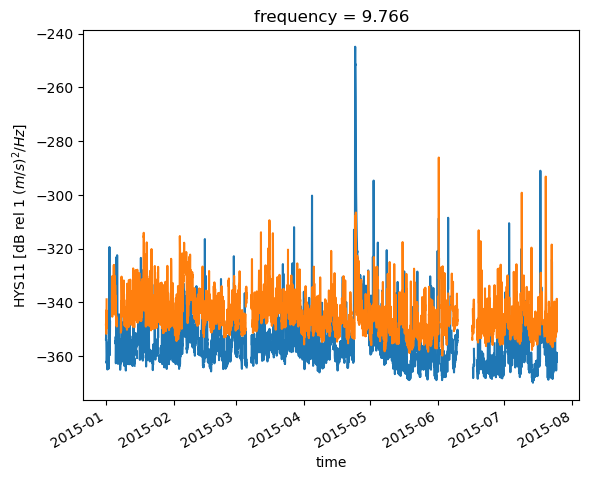

In [15]:
ds['AXAS1'][:,100].plot()
ds['HYS11'][:,100].plot()